# Super-resolution Benthic Object Detection

In our [last notebook](mbari_benthic_object_detection.ipynb), we evaluated [MBARI](https://www.mbari.org/)'s [Montery Bay Bethic Object Detector](https://zenodo.org/records/5539915) on the external out [TrashCAN](https://arxiv.org/abs/2007.08097) dataset. 
There, we found that model results were good, given the slight adaptations we had to make to compare against the new annotaitons. 
However, we also saw potential for increased model performance when applying some types of upscaling to the input images.

In this note, we will build a workflow to easily feed the inputs from the TrashCAN dataset through a super-resolution layer before feeding them into the MBARI model.
We will then evaluate the performance of the model with and without the super-resolution layer to see how much, if any improvement we can achieve.
It will also be important to measure copmutation time and memory usage to see if the tradeoff is worth it.

In later notes, we can explore fine-tuning the set-up built here. 
This is important to keep in mind when making decisions about how to implement the super-resolution layer.


In [2]:
#%pip install -r ../requirements.txt

In [169]:
from fathomnet.models.yolov5 import YOLOv5Model
from IPython.display import display
from pathlib import Path
from PIL import Image
from pycocotools.coco import COCO
from typing import List 

import json
import onnxruntime
import os
import numpy as np

In [4]:
root_dir = Path(os.getcwd().split("personal/")[0])
repo_dir = root_dir / "personal" / "ocean-species-identification"

# Load 
We will start by loading the TrashCAN dataset, the MBARI model, and label map between the two. Aside from path building, each requires only a single line of code to load.

In [5]:
data_dir = root_dir / "data" / "TrashCAN"
benthic_model_weights_path = root_dir / "personal" / "models" / "fathomnet_benthic" / "mbari-mb-benthic-33k.pt"

In [6]:
benthic_model = YOLOv5Model(benthic_model_weights_path)
trashcan_data = COCO(data_dir / "dataset" / "material_version" / "instances_val_trashcan.json")
benthic2trashcan = json.load(open(repo_dir / "data" / "benthic2trashcan.json"))

Using cache found in /Users/per.morten.halvorsen@schibsted.com/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-2-24 Python-3.11.5 torch-2.2.1 CPU

Fusing layers... 
Model summary: 476 layers, 91841704 parameters, 0 gradients
Adding AutoShape... 


loading annotations into memory...
Done (t=0.11s)
creating index...
index created!


# Super resolution model 

- (simple) feed COCO dataset through super resolution model
- (simple) feed outputs through MBARI model & show detections
- (full) build pipeline 

In [47]:
onnx_model_path = root_dir / "personal" / "models" / "sr_mobile_python" / "models_modelx4.ort"

## Upscale
Let's start a single example, to learn the input and output formats.  

0
(360, 480, 3)


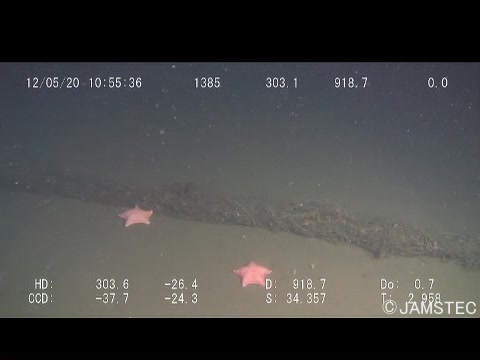

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
1
(270, 480, 3)


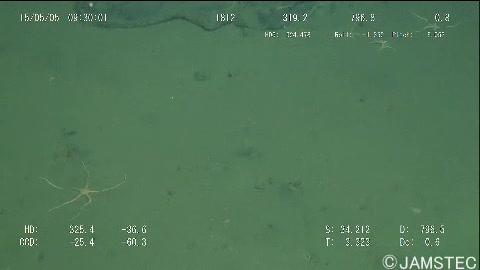

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
2
(270, 480, 3)


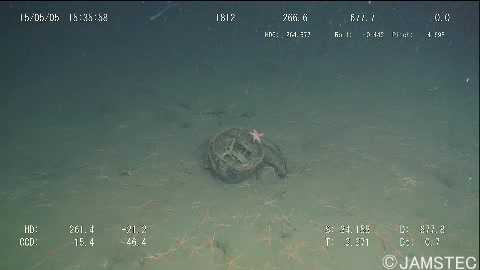

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
3
(270, 480, 3)


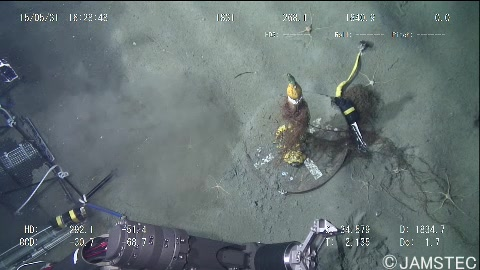

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
4
(270, 480, 3)


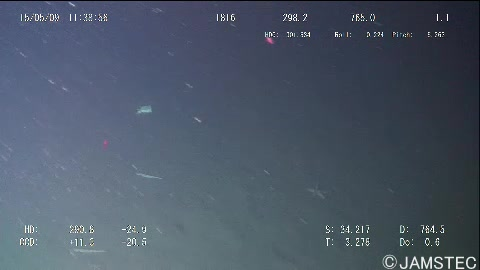

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
5
(270, 480, 3)


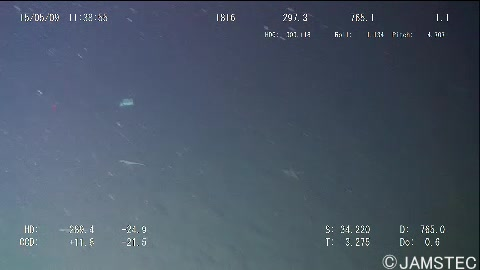

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
6
(270, 480, 3)


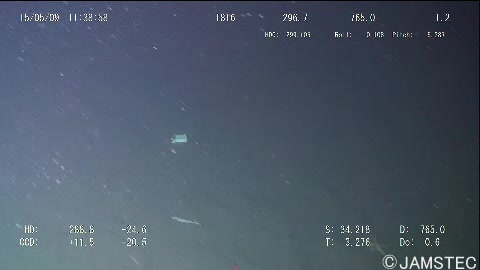

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
7
(360, 480, 3)


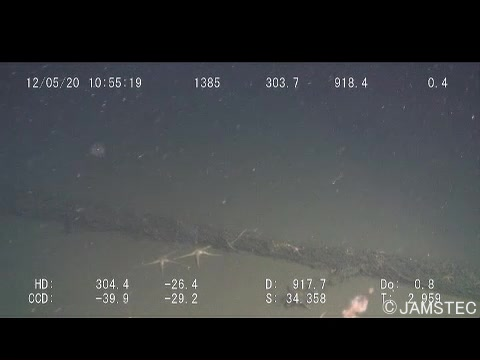

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
8
(270, 480, 3)


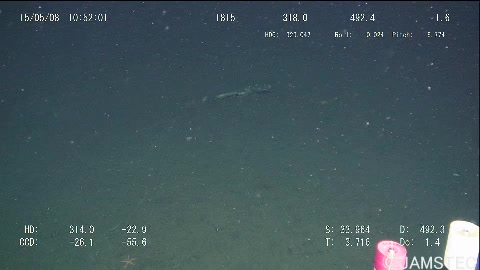

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
9
(270, 480, 3)


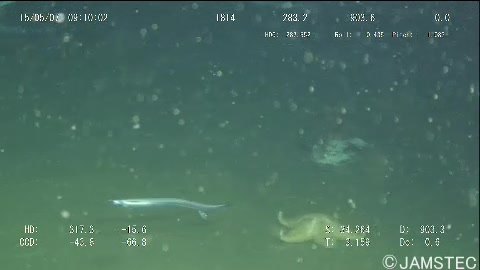

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
10
(360, 480, 3)


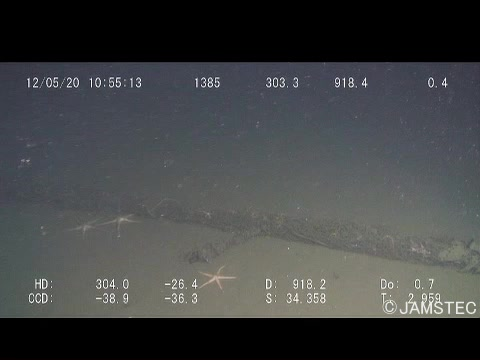

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
11
(270, 480, 3)


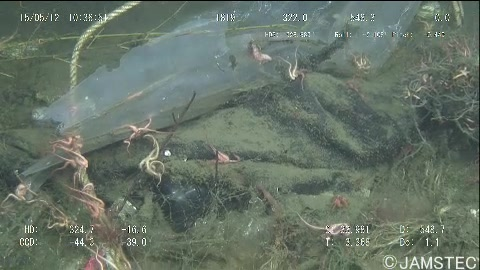

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
12
(360, 480, 3)


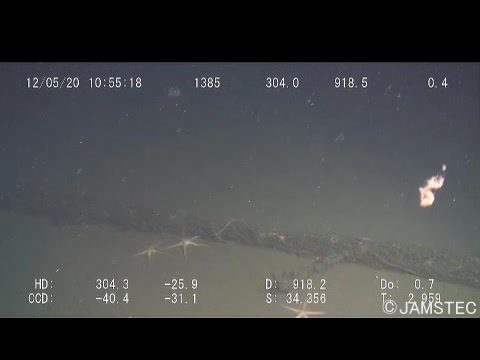

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
13
(360, 480, 3)


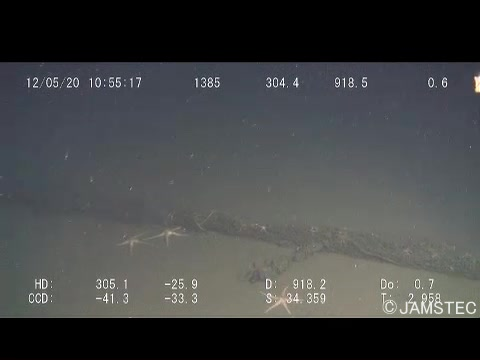

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
14
(270, 480, 3)


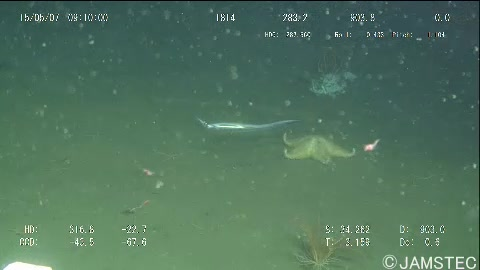

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
15
(270, 480, 3)


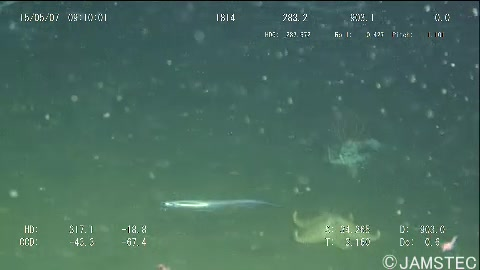

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
16
(270, 480, 3)


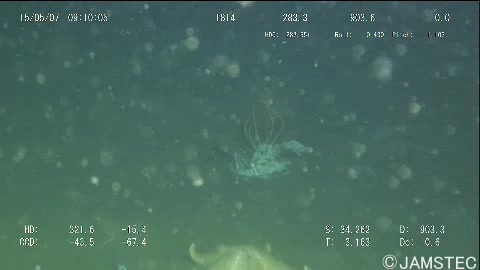

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
17
(270, 480, 3)


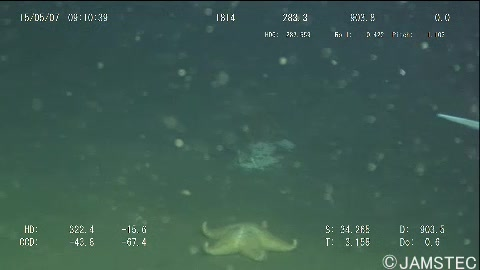

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
18
(270, 480, 3)


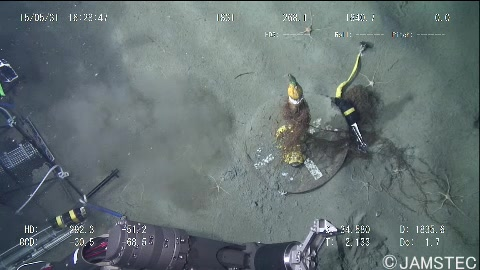

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
19
(360, 480, 3)


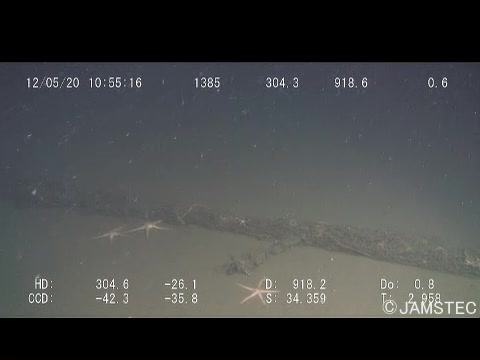

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
20
(270, 480, 3)


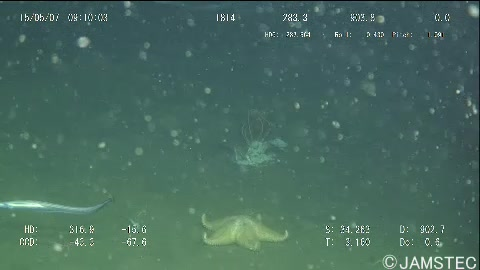

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
21
(270, 480, 3)


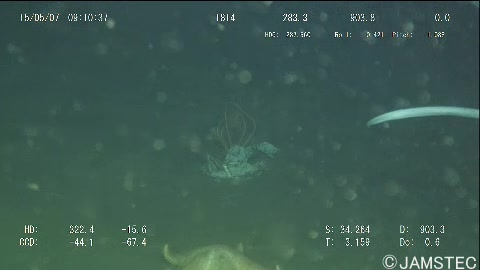

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
22
(360, 480, 3)


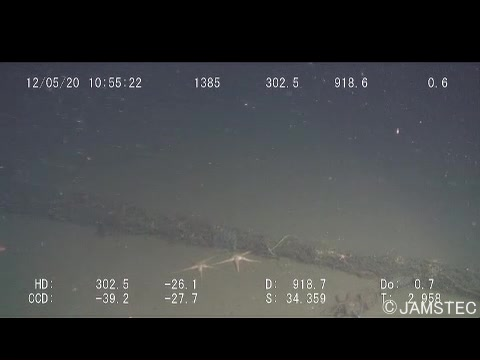

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
23
(270, 480, 3)


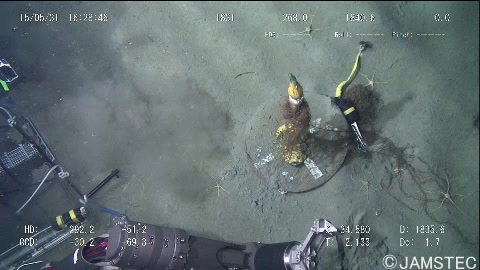

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
24
(270, 480, 3)


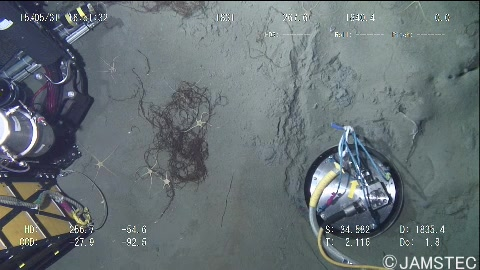

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
25
(360, 480, 3)


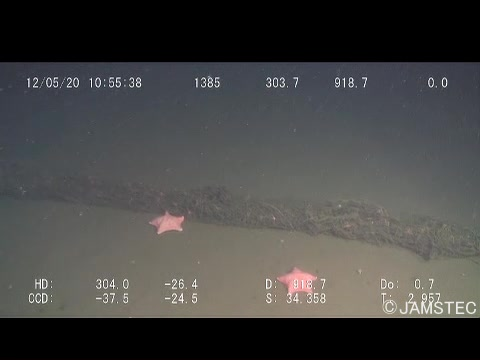

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
26
(270, 480, 3)


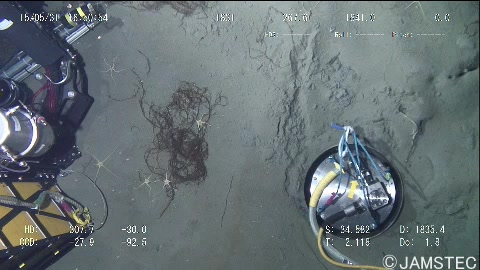

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
27
(360, 480, 3)


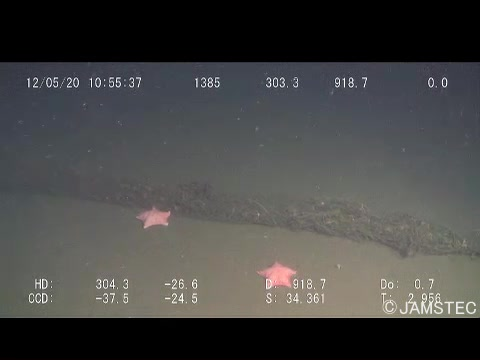

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
28
(360, 480, 3)


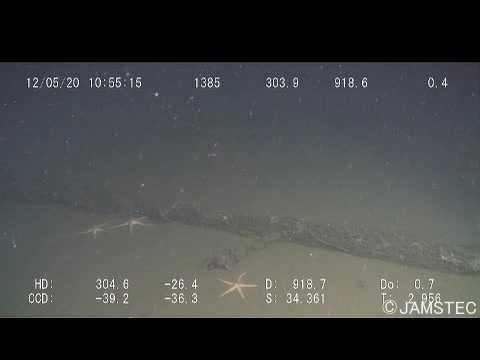

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
29
(360, 480, 3)


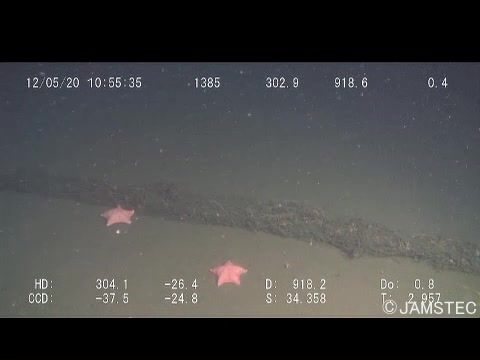

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
30
(360, 480, 3)


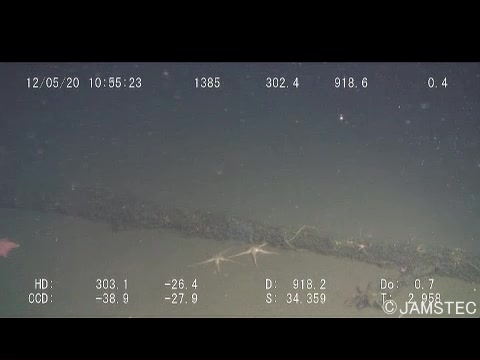

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
31
(270, 480, 3)


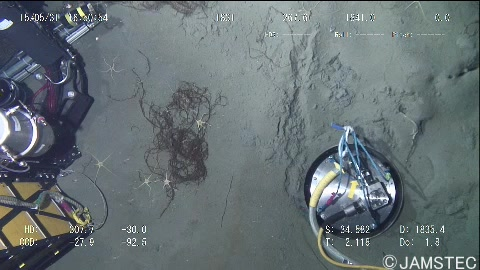

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
32
(270, 480, 3)


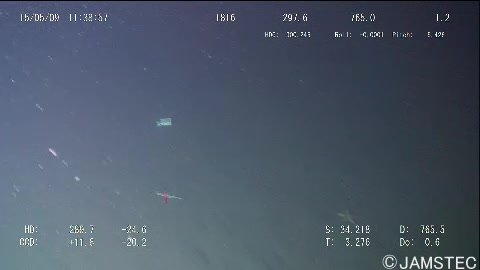

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
33
(270, 480, 3)


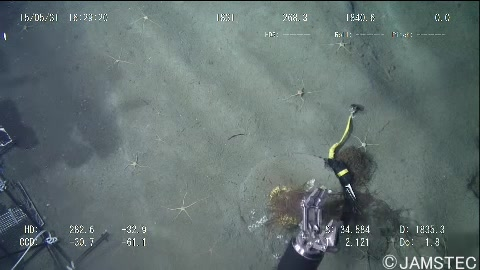

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
34
(270, 480, 3)


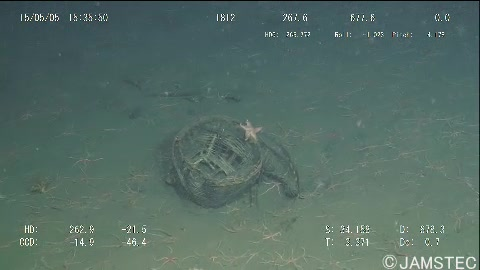

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
35
(360, 480, 3)


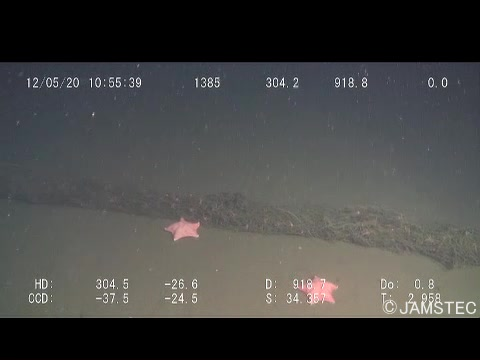

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
36
(270, 480, 3)


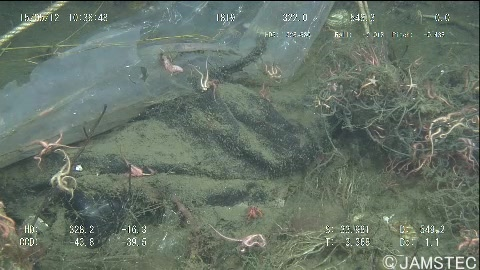

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
37
(360, 480, 3)


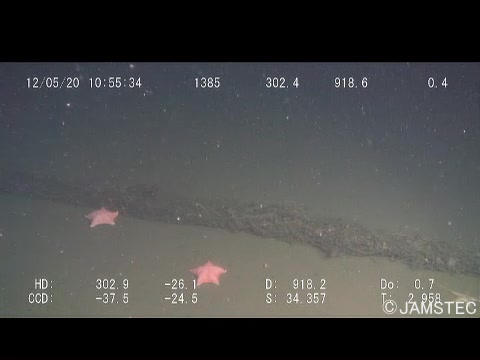

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
38
(360, 480, 3)


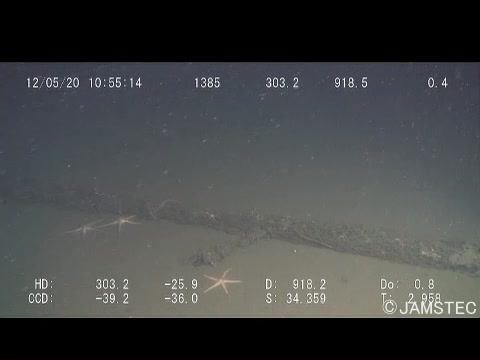

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
39
(270, 480, 3)


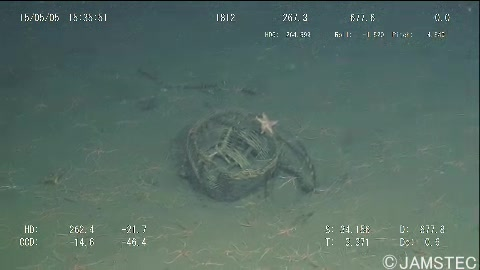

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
40
(360, 480, 3)


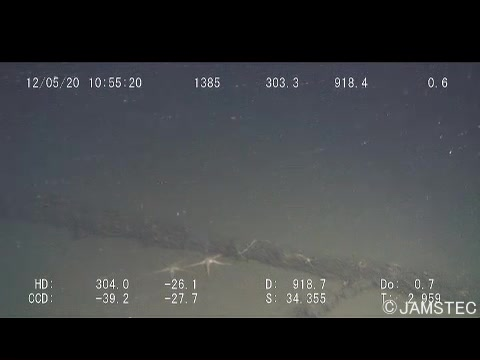

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
41
(270, 480, 3)


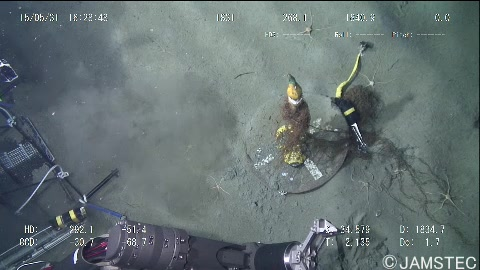

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
42
(270, 480, 3)


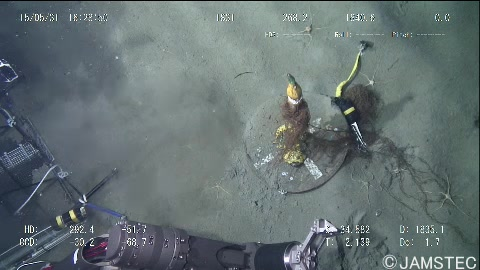

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
43
(360, 480, 3)


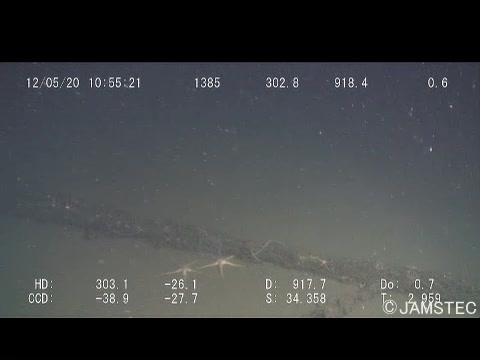

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
44
(270, 480, 3)


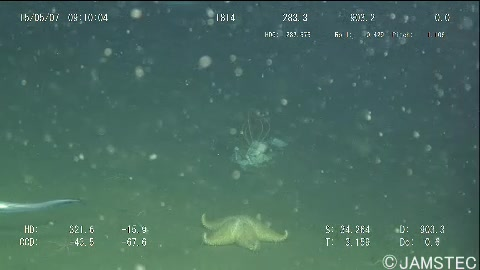

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
45
(360, 480, 3)


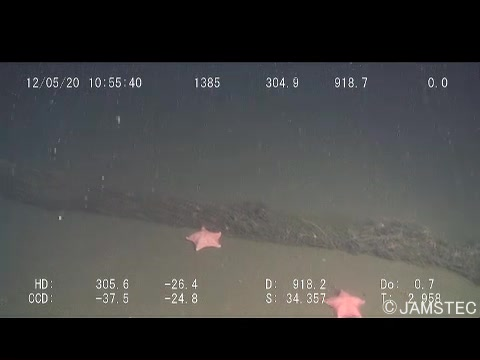

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
46
(270, 480, 3)


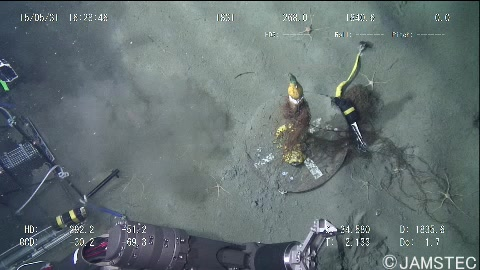

~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
47


IndexError: list index out of range

In [117]:
for i in range(50):
    print(i)
    starfish_ids = trashcan_data.getImgIds(catIds=trashcan_data.getCatIds(catNms=["animal_starfish"]))
    example_image_element = trashcan_data.loadImgs(starfish_ids[i])[0]
    example_image_path = data_dir / "dataset" / "material_version" /  "val" / example_image_element["file_name"]
    example_image = Image.open(example_image_path)
    print(np.array(example_image).shape)
    display(example_image)
    print("~~"*40)

(270, 480, 3)


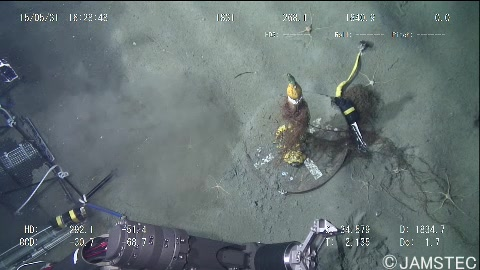

In [138]:
starfish_ids = trashcan_data.getImgIds(catIds=trashcan_data.getCatIds(catNms=["animal_starfish"]))
example_image_element = trashcan_data.loadImgs(starfish_ids[3])[0]
example_image_path = data_dir / "dataset" / "material_version" /  "val" / example_image_element["file_name"]
example_image = Image.open(example_image_path)
print(np.array(example_image).shape)
display(example_image)


The following methods were adapted from the `sr_mobile_python`'s [`inference`](https://github.com/bookbot-hive/sr_mobile_pytorch/blob/main/sr_mobile_pytorch/inference.py) module. 

In [139]:
import numpy as np
import cv2
import onnxruntime
from glob import glob
import os
from tqdm.auto import tqdm


def pre_process(img: np.array) -> np.array:
    # H, W, C -> C, H, W
    img = np.transpose(img[:, :, 0:3], (2, 0, 1))
    # C, H, W -> 1, C, H, W
    img = np.expand_dims(img, axis=0).astype(np.float32)
    return img


def post_process(img: np.array) -> np.array:
    # 1, C, H, W -> C, H, W
    img = np.squeeze(img)
    # C, H, W -> H, W, C
    img = np.transpose(img, (1, 2, 0))
    return img


def save(img: np.array, save_name: str) -> None:
    cv2.imwrite(save_name, img)


def inference(model_path: str, img_array: np.array) -> np.array:
    # unasure about ability to train an onnx model from a Mac
    ort_session = onnxruntime.InferenceSession(model_path)
    ort_inputs = {ort_session.get_inputs()[0].name: img_array}
    ort_outs = ort_session.run(None, ort_inputs)

    return ort_outs[0]

  0%|          | 0/1 [00:00<?, ?it/s]

(1080, 1920, 3)


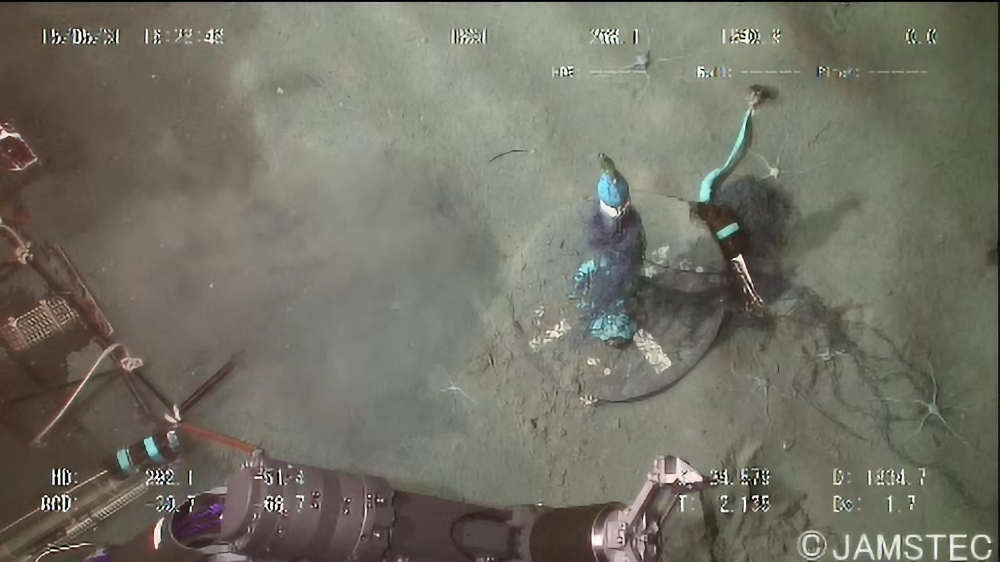

In [166]:
def upscale(image_paths, model_path):
    outputs = []

    for image_path in tqdm(image_paths):

        img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)
        # filename = os.path.basename(image_path)

        if img.ndim == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)

        if img.shape[2] == 4:
            alpha = img[:, :, 3]  # GRAY
            alpha = cv2.cvtColor(alpha, cv2.COLOR_GRAY2BGR)  # BGR
            alpha_output = post_process(
                inference(model_path, pre_process(alpha))
            )  # BGR
            alpha_output = cv2.cvtColor(alpha_output, cv2.COLOR_BGR2GRAY)  # GRAY

            img = img[:, :, 0:3]  # BGR
            image_output = post_process(inference(model_path, pre_process(img)))  # BGR
            output_img = cv2.cvtColor(image_output, cv2.COLOR_BGR2BGRA)  # BGRA
            output_img[:, :, 3] = alpha_output
            # save(output_img, f"{save_path}/{filename}")
        elif img.shape[2] == 3:
            image_output = post_process(inference(model_path, pre_process(img)))  # BGR
            # save(image_output, f"{save_path}/{filename}")
        
        outputs += [image_output.astype('uint8')]
    
    return outputs


example_upscaled = upscale([str(example_image_path)], onnx_model_path)[0]

print(example_upscaled.shape)
Image.fromarray(example_upscaled)

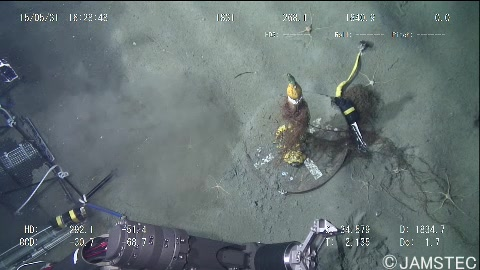

In [141]:
# reshow the original image for comparison
Image.fromarray(np.array(example_image))

## Classify upscaled (single)

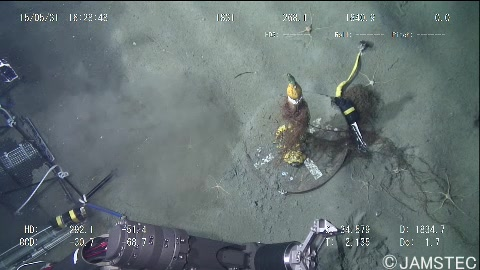

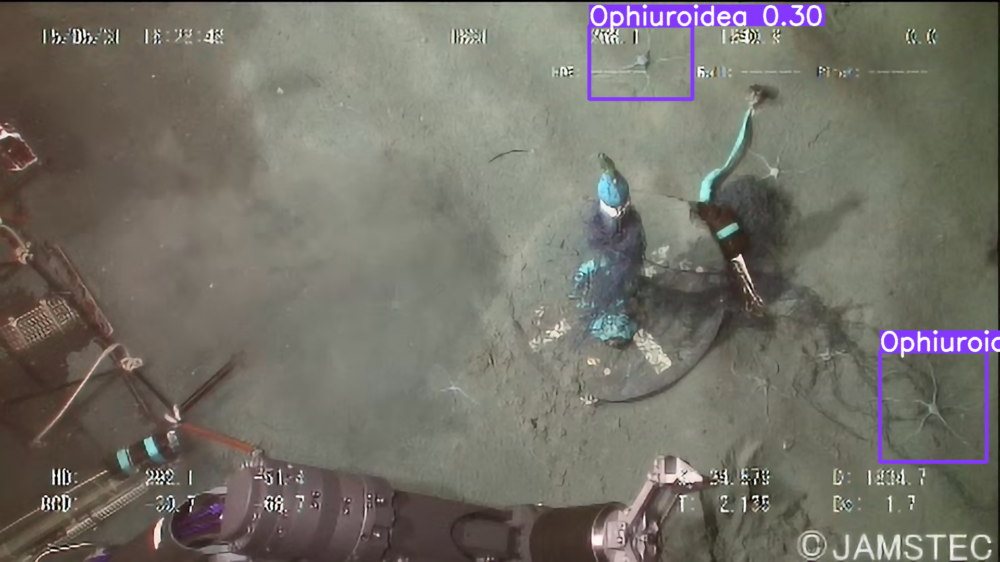

In [147]:
example_detections = benthic_model._model(example_image)
upscaled_detections = benthic_model._model(example_upscaled)

example_detections.show()
upscaled_detections.show()

Here we see what we are trying to acheive with this super-resolution layer.

TODO: Look into why the color is off. The hue seems to be a bit redder in th eupscaled version. 

The first few examples had little to no improvement, so we went with index 4 to see when such a pipeline might be useful. This is a form of cherry-picking our results, but mainly for visualization purposes. The final evaluation will fairly compare the methods, without any influence on input data. 

## Build prediction pipeline

In [151]:
onnx_model_path

PosixPath('/Users/per.morten.halvorsen@schibsted.com/personal/models/sr_mobile_python/models_modelx4.ort')

Using cache found in /Users/per.morten.halvorsen@schibsted.com/.cache/torch/hub/ultralytics_yolov5_master
YOLOv5 🚀 2024-2-24 Python-3.11.5 torch-2.2.1 CPU

Fusing layers... 
Model summary: 476 layers, 91841704 parameters, 0 gradients
Adding AutoShape... 


  0%|          | 0/1 [00:00<?, ?it/s]

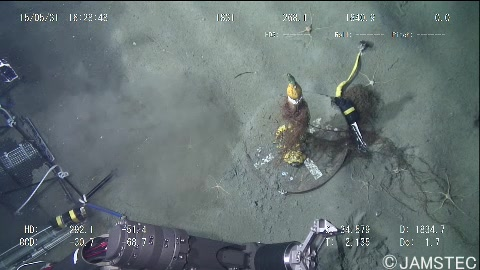

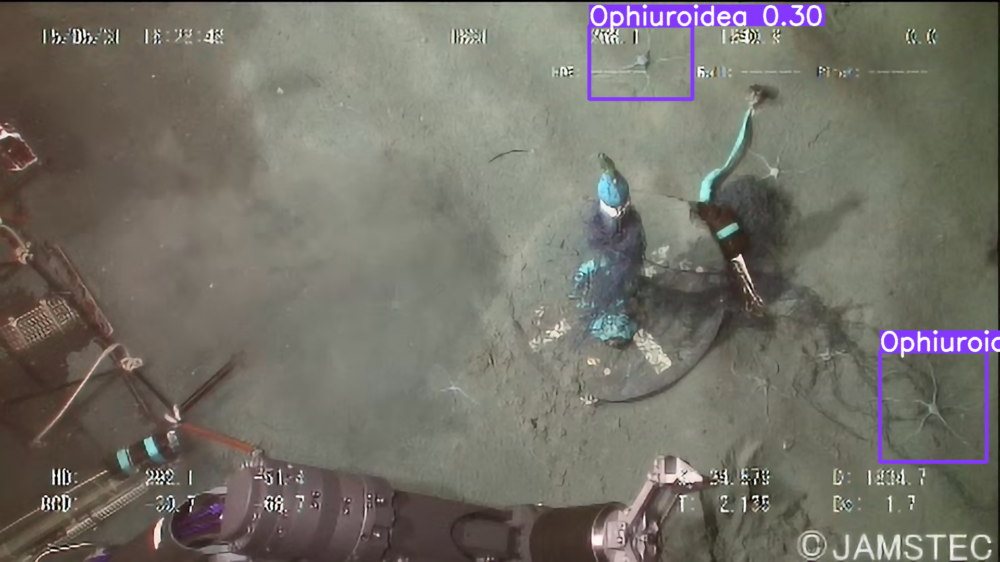

In [170]:
from fathomnet.models.yolov5 import YOLOv5Model

class YOLOv5ModelWithUpscale(YOLOv5Model):
    def __init__(self, detection_model_path: str,  upscale_model_path: str = None):
        super().__init__(detection_model_path)
        self.upscale_model_path = upscale_model_path


    def __call__(self, X: List[str]):
        if self.upscale_model_path:
            X = upscale(X, self.upscale_model_path)
        return self._model(X)


upscale_model = YOLOv5ModelWithUpscale(benthic_model_weights_path, onnx_model_path)

example_detections = benthic_model._model(str(example_image_path))
upscaled_detections = upscale_model([str(example_image_path)])  # upscale expects a list of image paths

example_detections.show()
upscaled_detections.show()


# Evaluation 

-  Import evaluation stuff (make any changes)
-  Run evaluation on pipeline (per category, whole avereage)
-  Compare results 
    - Table 
    - Graphs 
    - Analysis 

# Conclusion
Wrap things up and make a plan for next steps.